## 1. Necessary Imports, Fetch Dataset


In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import math
import numpy as np
import seaborn as sns


## 2. Preprocessing of Dataset

In [ ]:

# feature_columns is the list of attributes that we have found useful from the given dataset for our problem statement.


feature_columns = [
  "sofifa_id", 
  "short_name", 
  "height_cm", 
  "weight_kg",
  "potential",
  "value_eur",
  "player_positions",
  "preferred_foot",
  "weak_foot",
  "team_position",
  "nation_position",
  "pace",
  "shooting",
  "passing",
  "dribbling",
  "defending",
  "physic", 
  "gk_diving",
  "gk_handling",
  "gk_kicking",
  "gk_reflexes", 
  "gk_speed", 
  "gk_positioning", 
  "attacking_crossing", 
  "attacking_finishing", 
  "attacking_heading_accuracy", 
  "attacking_short_passing", 
  "attacking_volleys",
  "skill_dribbling",
  "skill_curve",
  "skill_fk_accuracy",
  "skill_long_passing",
  "skill_ball_control",
  "movement_acceleration",
  "movement_sprint_speed",
  "movement_agility",
  "movement_reactions",
  "movement_balance",
  "power_shot_power",
  "power_jumping",
  "power_stamina",
  "power_strength",
  "power_long_shots",
  "mentality_aggression",
  "mentality_interceptions",
  "mentality_positioning",
  "mentality_vision",
  "mentality_penalties",
  "mentality_composure",
  "defending_standing_tackle",
  "defending_sliding_tackle",
  "goalkeeping_diving",
  "goalkeeping_handling",
  "goalkeeping_kicking",
  "goalkeeping_positioning",
  "goalkeeping_reflexes"
]

In [ ]:

# Taken from - https://en.wikipedia.org/wiki/Association_football_positions
# Map_grid_positions is the dictionary that we have created so as to map a large number of positions to the 
# 10 positions as described by Figure-7 of our report. 
# map_vertical_positions, and map_horizontal_positions are used to classify the position of the player vertically and horizontally.

map_grid_positions = {
    'GK' : 'GK',
    
    'LB' : 'LB',
    'LWB' : 'LB',
    'LDM' : 'LB',
    'LCB' : 'LB',

    'SW' : 'CB',
    'CB' : 'CB',
    'CDM' : 'CB',
    
    'RB' : 'RB',
    'RWB' : 'RB',
    'RDM' : 'RB',
    'RCB' : 'RB',

    'LM' : 'LM',
    'LCM' : 'LM',
    'LAM' : 'LM',

    'CM' : 'CM',
    'CAM' : 'CM',

    'RM' : 'RM',
    'RCM' : 'RM',
    'RAM' : 'RM',

    'LW' : 'LF',
    'LS' : 'LF',
    'LF' : 'LF',

    'CF' : 'CF',
    'ST' : 'CF',

    'RW' : 'RF',
    'RS' : 'RF',
    'RF' : 'RF'
}

map_vertical_positions = {
    'GK' : 'GK',
    'LB' : 'B',
    'CB' : 'B',
    'RB' : 'B',

    'LM' : 'M',
    'CM' : 'M',
    'RM' : 'M',

    'LF' : 'F',
    'CF' : 'F',
    'RF' : 'F',

}

map_horizontal_positions = {
  'GK' : 'GK',
  'LB' : 'L',
  'LM' : 'L', 
  'LF' : 'L',

  'CB' : 'C',
  'CM' : 'C',
  'CF' : 'C',

  'RB' : 'R',
  'RM' : 'R',
  'RF' : 'R',
     
}



In [ ]:
def get_df(feature_columns):

    # Utility function to fetch dataset.

  df = pd.read_excel('./FIFA.xlsx', sheet_name = 'FIFA 23')
  df = df[feature_columns]
  return df

In [5]:
def choose_first_position(data):
  if data.find(",") != -1:
    data=data[:data.find(",")]
  return data.strip()

In [6]:
def preprocess(df):
  df['player_positions'] = df['player_positions'].apply(choose_first_position)
  df['player_positions'] = df['player_positions'].apply(lambda x: map_grid_positions[x])
  df['vertical_position'] = df['player_positions'].apply(lambda x: map_vertical_positions[x])
  df['horizontal_position'] = df['player_positions'].apply(lambda x: map_horizontal_positions[x])

  df = df.drop(
    labels = [
      'short_name', 
      'value_eur', 
      'weak_foot', 
      'team_position', 
      'nation_position',
      'sofifa_id', 
      ], 
      axis = 1)
  df = df.fillna(value = 0, axis = 1)
  print(len(df.columns))
  df['gk_cumulative'] = df[[  
    "gk_diving",
    "gk_handling",
    "gk_kicking",
    "gk_reflexes", 
    "gk_speed", 
    "gk_positioning"
  ]].mean(axis = 1)

  df['attacking_cumulative'] = df[[
    "attacking_crossing", 
    "attacking_finishing", 
    "attacking_heading_accuracy", 
    "attacking_short_passing", 
    "attacking_volleys"
  ]].mean(axis = 1)

  df['skill_cumulative'] = df[[
    "skill_dribbling",
    "skill_curve",
    "skill_fk_accuracy",
    "skill_long_passing",
    "skill_ball_control"
  ]].mean(axis = 1)

  df['movement_cumulative'] = df[[
    "movement_acceleration",
    "movement_sprint_speed",
    "movement_agility",
    "movement_reactions",
    "movement_balance"
  ]].mean(axis = 1)

  df['power_cumulative'] = df[[
    "power_shot_power",
    "power_jumping",
    "power_stamina",
    "power_strength",
    "power_long_shots"
  ]].mean(axis = 1)

  df['mentality_cumulative'] = df[[
    "mentality_aggression",
    "mentality_interceptions",
    "mentality_positioning",
    "mentality_vision",
    "mentality_penalties",
    "mentality_composure"
  ]].mean(axis = 1)

  df['mentality_cumulative'] = df[[
    "mentality_aggression",
    "mentality_interceptions",
    "mentality_positioning",
    "mentality_vision",
    "mentality_penalties",
    "mentality_composure"
  ]].mean(axis = 1)

  df['goalkeeping_cumulative'] = df[[
    "goalkeeping_diving",
    "goalkeeping_handling",
    "goalkeeping_kicking",
    "goalkeeping_positioning",
    "goalkeeping_reflexes"                        
  ]].mean(axis = 1)

  df = df.drop(
    labels = [
      "gk_diving",
      "gk_handling",
      "gk_kicking",
      "gk_reflexes", 
      "gk_speed", 
      "gk_positioning", 
      "attacking_crossing", 
      "attacking_finishing", 
      "attacking_heading_accuracy", 
      "attacking_short_passing", 
      "attacking_volleys",
      "skill_dribbling",
      "skill_curve",
      "skill_fk_accuracy",
      "skill_long_passing",
      "skill_ball_control",
      "movement_acceleration",
      "movement_sprint_speed",
      "movement_agility",
      "movement_reactions",
      "movement_balance",
      "power_shot_power",
      "power_jumping",
      "power_stamina",
      "power_strength",
      "power_long_shots",
      "mentality_aggression",
      "mentality_interceptions",
      "mentality_positioning",
      "mentality_vision",
      "mentality_penalties",
      "mentality_composure",
      "defending_standing_tackle",
      "defending_sliding_tackle",
      "goalkeeping_diving",
      "goalkeeping_handling",
      "goalkeeping_kicking",
      "goalkeeping_positioning",
      "goalkeeping_reflexes"
      ], 
      axis = 1)

  return df

In [7]:
df = get_df(feature_columns)
df = preprocess(df)

52


In [8]:
df.head()

,height_cm,weight_kg,potential,player_positions,preferred_foot,pace,shooting,passing,dribbling,defending,physic,vertical_position,horizontal_position,gk_cumulative,attacking_cumulative,skill_cumulative,movement_cumulative,power_cumulative,mentality_cumulative,goalkeeping_cumulative
0,170,72,93,RF,Left,85.0,92.0,91.0,95.0,38.0,65.0,F,R,0.0,85.8,94.0,90.2,77.8,73.833333,10.8
1,187,83,92,CF,Right,89.0,93.0,81.0,89.0,35.0,77.0,F,C,0.0,87.4,82.8,86.2,88.8,74.666667,11.6
2,188,87,93,GK,Right,0,0,0,0,0,0,GK,GK,81.5,19.0,21.8,61.4,53.6,34.666667,87.4
3,184,80,91,CF,Right,78.0,91.0,78.0,85.0,43.0,82.0,F,C,0.0,84.6,81.4,81.4,84.0,79.833333,10.2
4,175,68,91,LF,Right,91.0,85.0,86.0,94.0,36.0,59.0,F,L,0.0,81.6,89.6,90.6,71.4,74.833333,11.8


## 3. EDA

[2084, 1502, 4766, 1451, 1069, 3389, 1065, 420, 2760, 438]


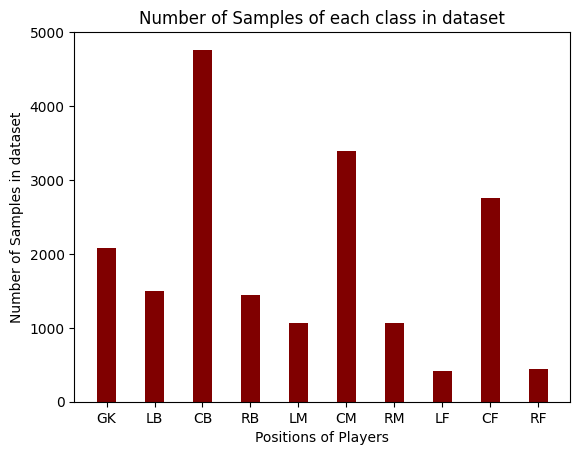

In [9]:
def plot_data_balance(df):
  positions = [
    'GK',
    'LB',
    'CB',
    'RB',
    'LM',
    'CM',
    'RM',
    'LF',
    'CF',
    'RF'             
  ]
  num_samples = []
  for position in positions:
    num_samples.append(len(df[df['player_positions'] == position]))
    
  print(num_samples)
  plt.bar(positions, num_samples, color ='maroon', width = 0.4)
 
  plt.xlabel("Positions of Players")
  plt.ylabel("Number of Samples in dataset")
  plt.title("Number of Samples of each class in dataset")
  plt.show()


plot_data_balance(df)

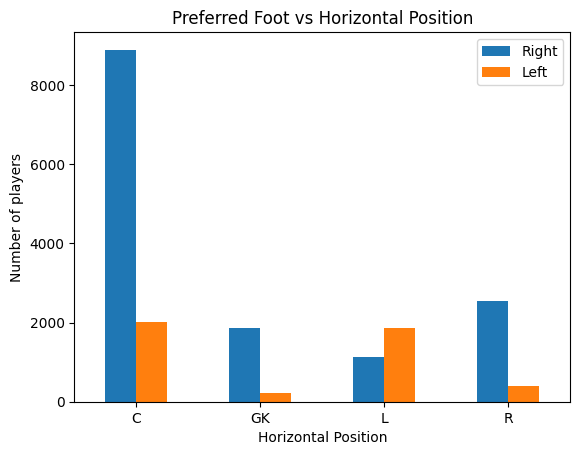

In [10]:
# Preferred Foot vs Horizontal Classes
def plot_preferred_foot(df):
  temp_df=df.groupby(['horizontal_position'])['preferred_foot'].value_counts()
  right_df=temp_df.loc[:,'Right']
  left_df=temp_df.loc[:,'Left']

  mydf = pd.DataFrame({"Right":right_df,"Left":left_df})
  ax = mydf.plot.bar(rot=0, title="Preferred Foot vs Horizontal Position")
  ax.set_xlabel("Horizontal Position")
  ax.set_ylabel("Number of players")
  plt.show()

plot_preferred_foot(df)

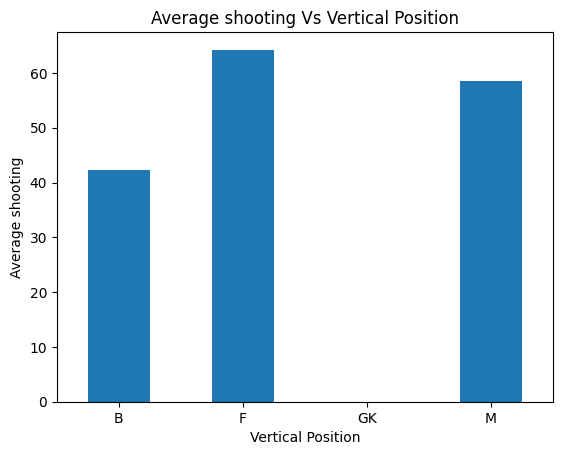

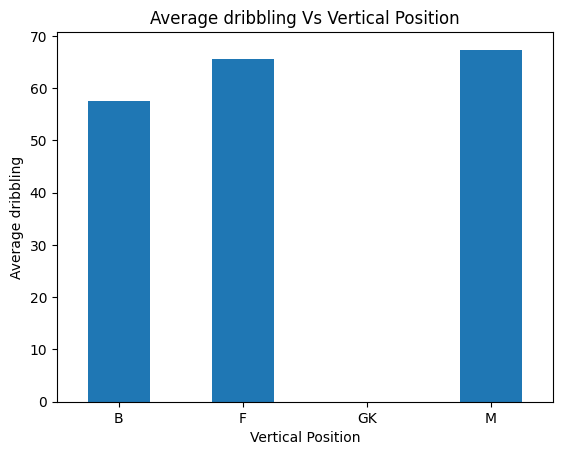

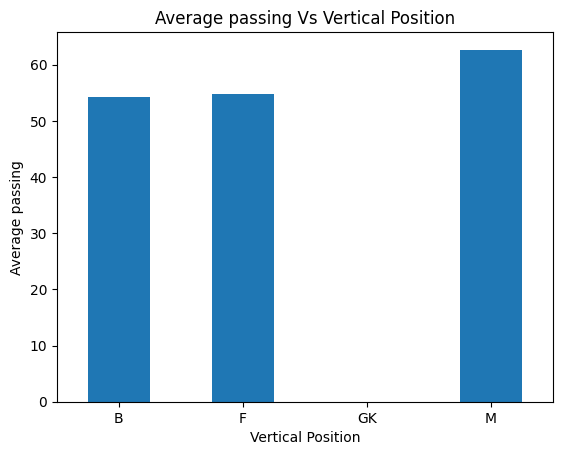

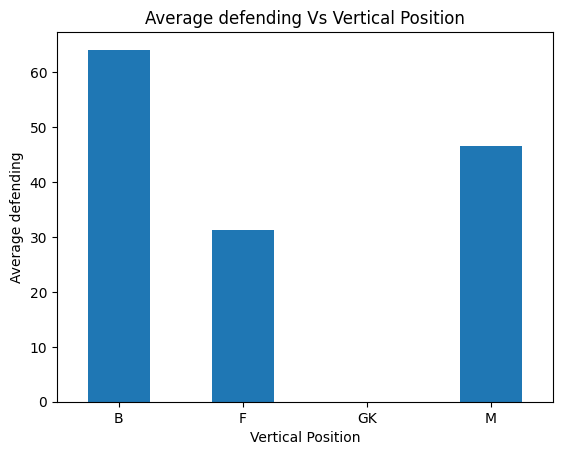

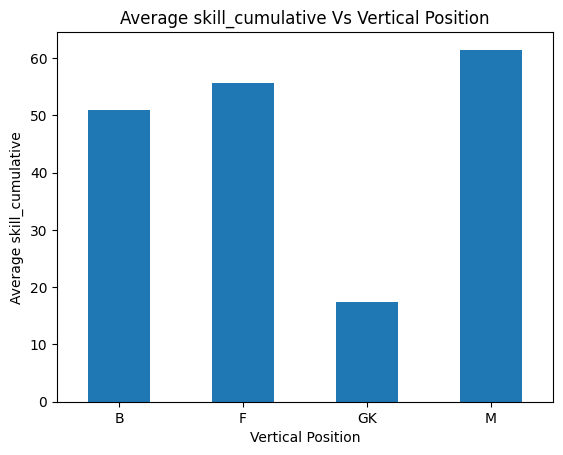

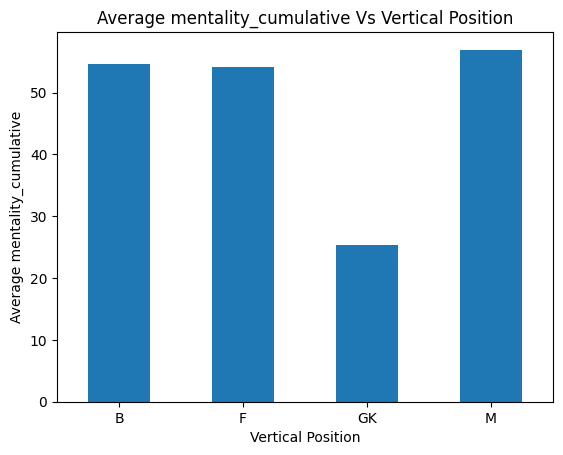

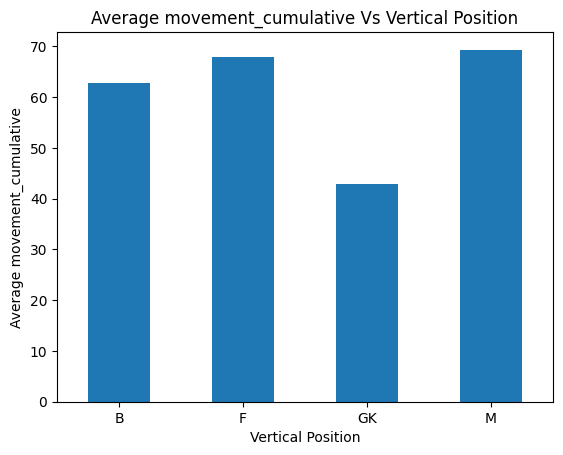

In [11]:
def plot_vertical(df):
  ListofPlotsVsVerticalClasses = ['shooting','dribbling','passing','defending','skill_cumulative','mentality_cumulative','movement_cumulative' ]
  for x in ListofPlotsVsVerticalClasses:
    temp_df=df.groupby(['vertical_position'])[x].mean()
    ax = temp_df.plot.bar(rot=0)
    ax.set_xlabel("Vertical Position")
    ax.set_ylabel(f"Average {x}")
    plt.title(f"Average {x} Vs Vertical Position")
    plt.show()

plot_vertical(df)

## 4. Handling Class Imbalance

In [12]:
from ctgan import CTGAN

In [13]:


def handleClassImbalance(df):
    categorical = ['preferred_foot']
    ctgan = CTGAN()

    df_lf = df[df['player_positions'] == 'LF']
    df_lf = df_lf.drop(
        labels=['player_positions', 'horizontal_position', 'vertical_position'],
        axis=1
    )
    ctgan.fit(df_lf, categorical)
    df_lf_gen = ctgan.sample(400)
    h = ['L' for _ in range(400)]
    v = ['F' for _ in range(400)]
    pp = ['LF' for _ in range(400)]
    df_to_append = pd.DataFrame(
        list(zip(h, v, pp)),
        columns=['horizontal_position', 'vertical_position', 'player_positions']
    )
    df_lf_gen = df_lf_gen.join(df_to_append)
    df = pd.concat([df, df_lf_gen], ignore_index=True)

    # Handle 'RF' class
    df_rf = df[df['player_positions'] == 'RF']
    df_rf = df_rf.drop(
        labels=['player_positions', 'horizontal_position', 'vertical_position'],
        axis=1
    )
    ctgan.fit(df_rf, categorical)
    df_rf_gen = ctgan.sample(400)
    h = ['R' for _ in range(400)]
    v = ['F' for _ in range(400)]
    pp = ['RF' for _ in range(400)]
    df_to_append = pd.DataFrame(
        list(zip(h, v, pp)),
        columns=['horizontal_position', 'vertical_position', 'player_positions']
    )
    df_rf_gen = df_rf_gen.join(df_to_append)
    df = pd.concat([df, df_rf_gen], ignore_index=True)

    print(df.head())
    return df

df = handleClassImbalance(df)


  height_cm weight_kg potential player_positions preferred_foot  pace  \
0       170        72        93               RF           Left  85.0   
1       187        83        92               CF          Right  89.0   
2       188        87        93               GK          Right     0   
3       184        80        91               CF          Right  78.0   
4       175        68        91               LF          Right  91.0   

  shooting passing dribbling defending physic vertical_position  \
0     92.0    91.0      95.0      38.0   65.0                 F   
1     93.0    81.0      89.0      35.0   77.0                 F   
2        0       0         0         0      0                GK   
3     91.0    78.0      85.0      43.0   82.0                 F   
4     85.0    86.0      94.0      36.0   59.0                 F   

  horizontal_position gk_cumulative attacking_cumulative skill_cumulative  \
0                   R           0.0                 85.8             94.0   
1   

In [14]:
df.head()

,height_cm,weight_kg,potential,player_positions,preferred_foot,pace,shooting,passing,dribbling,defending,physic,vertical_position,horizontal_position,gk_cumulative,attacking_cumulative,skill_cumulative,movement_cumulative,power_cumulative,mentality_cumulative,goalkeeping_cumulative
0,170,72,93,RF,Left,85.0,92.0,91.0,95.0,38.0,65.0,F,R,0.0,85.8,94.0,90.2,77.8,73.833333,10.8
1,187,83,92,CF,Right,89.0,93.0,81.0,89.0,35.0,77.0,F,C,0.0,87.4,82.8,86.2,88.8,74.666667,11.6
2,188,87,93,GK,Right,0,0,0,0,0,0,GK,GK,81.5,19.0,21.8,61.4,53.6,34.666667,87.4
3,184,80,91,CF,Right,78.0,91.0,78.0,85.0,43.0,82.0,F,C,0.0,84.6,81.4,81.4,84.0,79.833333,10.2
4,175,68,91,LF,Right,91.0,85.0,86.0,94.0,36.0,59.0,F,L,0.0,81.6,89.6,90.6,71.4,74.833333,11.8


[2084, 1502, 4766, 1451, 1069, 3389, 1065, 820, 2760, 838]


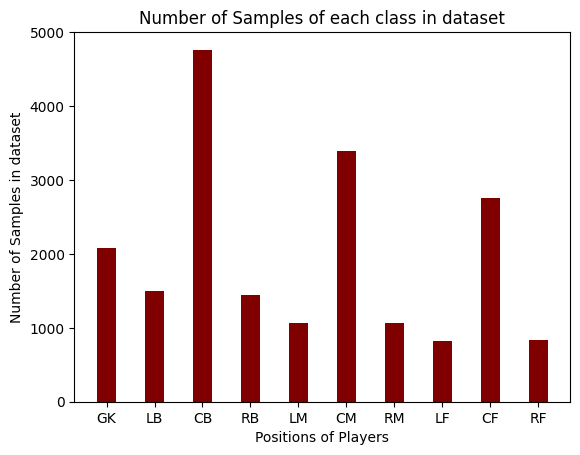

In [15]:
plot_data_balance(df)

## 5. Feature Study

In [16]:
df.columns

Index(['height_cm', 'weight_kg', 'potential', 'player_positions',
       'preferred_foot', 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'vertical_position', 'horizontal_position',
       'gk_cumulative', 'attacking_cumulative', 'skill_cumulative',
       'movement_cumulative', 'power_cumulative', 'mentality_cumulative',
       'goalkeeping_cumulative'],
      dtype='object')

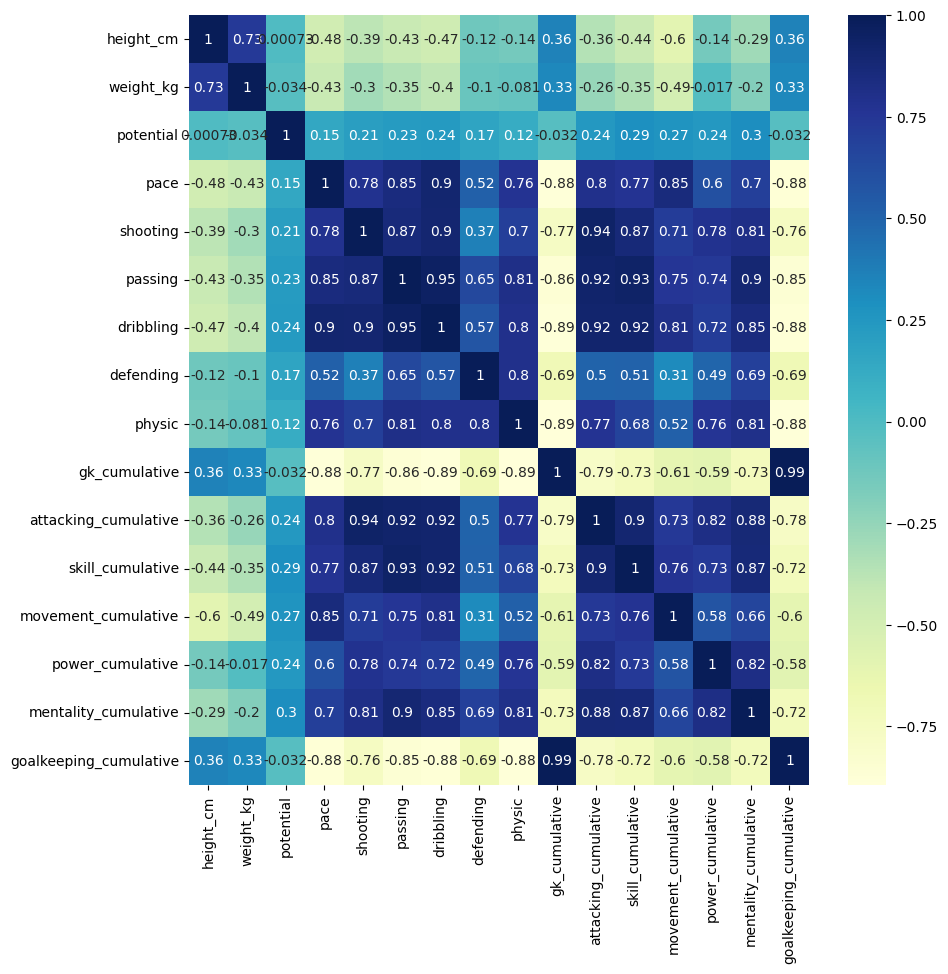

In [17]:
def plotCorr(df):
  fig, ax = plt.subplots(figsize=(10,10))         # Sample figsize in inches
  dataplot = sns.heatmap(df.drop(['player_positions','preferred_foot','vertical_position', 'horizontal_position'], axis=1).corr(), cmap="YlGnBu", annot=True, ax=ax)
  plt.show()


plotCorr(df)

In [18]:
df.columns

Index(['height_cm', 'weight_kg', 'potential', 'player_positions',
       'preferred_foot', 'pace', 'shooting', 'passing', 'dribbling',
       'defending', 'physic', 'vertical_position', 'horizontal_position',
       'gk_cumulative', 'attacking_cumulative', 'skill_cumulative',
       'movement_cumulative', 'power_cumulative', 'mentality_cumulative',
       'goalkeeping_cumulative'],
      dtype='object')

In [19]:
def handleHighCorr(df):
  df['attacking_cumulative'] = df[[
      'pace',
      "attacking_cumulative",
      "shooting",
      "passing",
      "dribbling"
    ]].mean(axis = 1)
  
  df['goalkeeping_cumulative'] = df[[
      'gk_cumulative',
      "goalkeeping_cumulative",
    ]].mean(axis = 1)
  
  df = df.drop(
    labels = [
      'pace',
      "shooting",
      "passing",
      "dribbling",
      'gk_cumulative'
      ],
    axis=1
  )
  return df




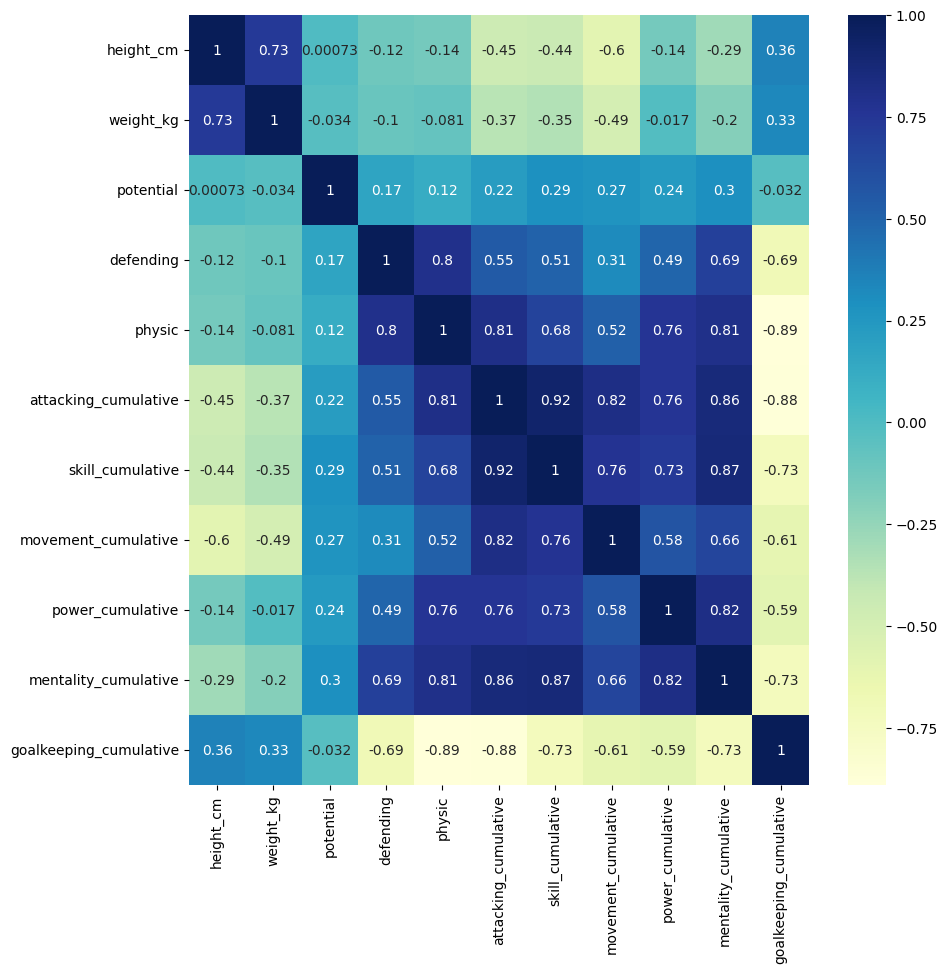

In [20]:
df = handleHighCorr(df)
plotCorr(df)

## 6. Higher dimension Visualisation using PCA

In [21]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn

In [22]:
def plotPairwise(df):
  df2 = df.drop(labels=['horizontal_position', 'vertical_position'], axis=1)
  sns.pairplot(
      data=df2, 
      hue="player_positions",
  )

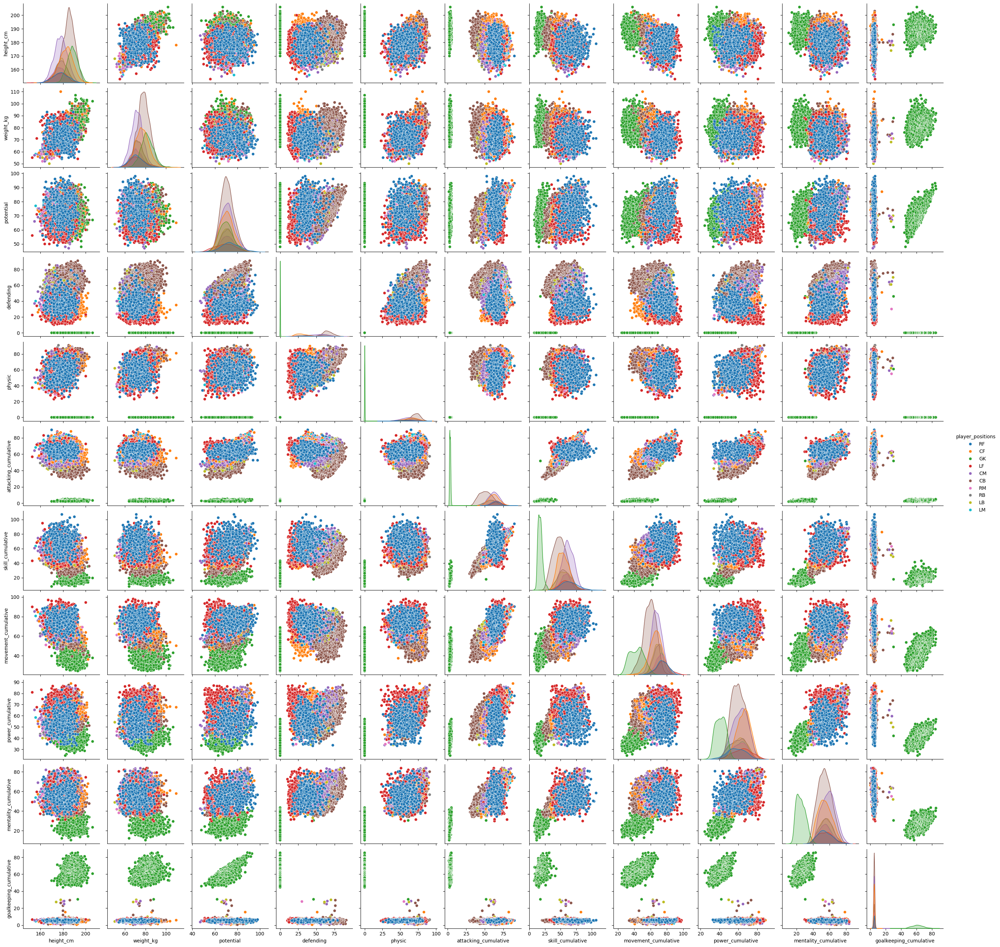

In [23]:
# print(df[df.index.duplicated()])
plotPairwise(df)


### PCA

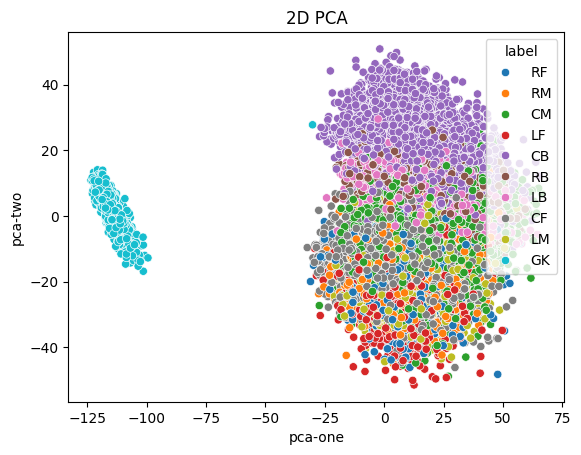

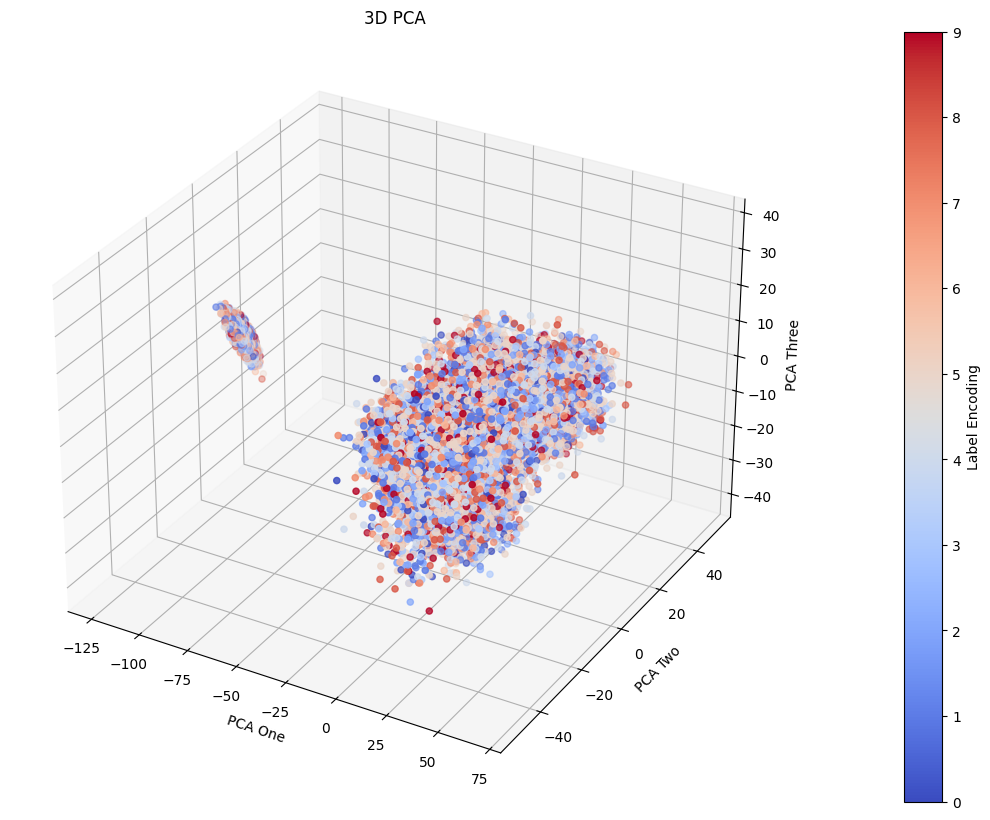

In [24]:
# def performPCA(df):
  

  
#   df2 = df.drop(labels=['horizontal_position', 'vertical_position','player_positions','preferred_foot'], axis=1)
#   pca = PCA(n_components=3)
#   #pca.fit(df2)
#   pca_result = pca.fit_transform(np.array(df2))
#   df2['label'] = df['player_positions'].squeeze()

#   df2['pca-one'] = pca_result[:, 0]
#   df2['pca-two'] = pca_result[:, 1]
#   df2['pca-three'] = pca_result[:, 2]
#   np.random.seed(0)
#   indices = np.random.permutation(df2.shape[0])[:]
#   seaborn.scatterplot(data=df2.loc[indices], x='pca-one', y='pca-two', hue='label')
#   plt.show()
#   ax = plt.figure(figsize=(16,10)).gca(projection='3d')
# # plt.show()
#   ax.scatter(
#     xs=df2.loc[indices]['pca-one'], 
#     ys=df2.loc[indices]['pca-two'], 
#     zs=df2.loc[indices]['pca-three'], 
#     c=pd.factorize(df.player_positions)[0], 
#     cmap='coolwarm',
#   )
#   ax.set_xlabel('pca-one')
#   ax.set_ylabel('pca-two')
#   ax.set_zlabel('pca-three')
#   plt.show()


# performPCA(df)


from mpl_toolkits.mplot3d import Axes3D  

def performPCA(df):
    df2 = df.drop(labels=['horizontal_position', 'vertical_position', 'player_positions', 'preferred_foot'], axis=1)

    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(np.array(df2))

    df2['label'] = df['player_positions'].squeeze()
    df2['pca-one'] = pca_result[:, 0]
    df2['pca-two'] = pca_result[:, 1]
    df2['pca-three'] = pca_result[:, 2]

    np.random.seed(0)
    indices = np.random.permutation(df2.shape[0])

    sns.scatterplot(data=df2.loc[indices], x='pca-one', y='pca-two', hue='label')
    plt.title('2D PCA')
    plt.show()

    fig = plt.figure(figsize=(16, 10))
    ax = fig.add_subplot(111, projection='3d')  
    
    scatter = ax.scatter(
        xs=df2.loc[indices]['pca-one'], 
        ys=df2.loc[indices]['pca-two'], 
        zs=df2.loc[indices]['pca-three'], 
        c=pd.factorize(df['player_positions'])[0],  
        cmap='coolwarm'
    )
    

    ax.set_xlabel('PCA One')
    ax.set_ylabel('PCA Two')
    ax.set_zlabel('PCA Three')
    plt.colorbar(scatter, ax=ax, pad=0.1, label='Label Encoding')
    plt.title('3D PCA')
    plt.show()


performPCA(df)


## 7. Evaluation of Different Models


### Imports for Models

In [25]:
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import cross_validate, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.multioutput import MultiOutputClassifier
from sklearn.model_selection import train_test_split, cross_val_score, RepeatedStratifiedKFold, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import accuracy_score, balanced_accuracy_score, precision_score, recall_score, confusion_matrix, multilabel_confusion_matrix, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score, cross_validate, RepeatedStratifiedKFold, KFold, GridSearchCV
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn import tree
from matplotlib import pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
import graphviz
import cv2
from IPython.display import display
from PIL import Image
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [26]:
sklearn.__version__

'1.5.2'

In [27]:
df = pd.get_dummies(data = df, columns = ['preferred_foot'], drop_first = True)

In [28]:
df.head()

,height_cm,weight_kg,potential,player_positions,defending,physic,vertical_position,horizontal_position,attacking_cumulative,skill_cumulative,movement_cumulative,power_cumulative,mentality_cumulative,goalkeeping_cumulative,preferred_foot_Right
0,170,72,93,RF,38.0,65.0,F,R,89.76,94.0,90.2,77.8,73.833333,5.4,False
1,187,83,92,CF,35.0,77.0,F,C,87.88,82.8,86.2,88.8,74.666667,5.8,True
2,188,87,93,GK,0,0,GK,GK,3.8,21.8,61.4,53.6,34.666667,84.45,True
3,184,80,91,CF,43.0,82.0,F,C,83.32,81.4,81.4,84.0,79.833333,5.1,True
4,175,68,91,LF,36.0,59.0,F,L,87.52,89.6,90.6,71.4,74.833333,5.9,True


In [29]:
def get_train_val_test_split(df, train_ratio, val_ratio, test_ratio):

  input_features, output_classes = [], []
  for column in df:
    if ('vertical_position') != column and ('horizontal_position' != column) and ('player_positions' != column):
      input_features.append(column)

  X = df[input_features]
  X = preprocessing.StandardScaler().fit(X).transform(X)
  Y = df[['vertical_position', 'horizontal_position', 'player_positions']]

  X_train, X_remaining, Y_train, Y_remaining = train_test_split(X, Y, test_size = val_ratio + test_ratio, random_state = 42)
  X_valid, X_test, Y_valid, Y_test = train_test_split(X_remaining, Y_remaining, test_size = test_ratio, random_state = 42)
  return X, Y, X_train, Y_train, X_valid, Y_valid, X_test, Y_test, df, input_features, output_classes

### Naive Bayes

In [30]:
class NaiveBayes:    

  def gnb_single(self, X_train, Y_train, X_valid, Y_valid):
    Y_train = Y_train[['player_positions']]
    Y_valid = Y_valid[['player_positions']]
    gaussian = GaussianNB(var_smoothing = 1e-9) #this is actually the default one
    gaussian.fit(X_train, Y_train)
    pred = gaussian.predict(X_valid)
    print('Evaluation of NB - single: ')
    self.evaluate(Y_valid, pred)
  

  def gnb_multi(self, X_train, Y_train, X_valid, Y_valid):
    gaussian = MultiOutputClassifier(GaussianNB(var_smoothing=1e-9))
    Y_train = Y_train.drop(labels=['player_positions'], axis = 1)    

    gaussian.fit(X_train, Y_train)
    predictions = gaussian.predict(X_valid)

    combined_predictions = []
    for i in range(len(predictions)):
      cp = predictions[i][1] + predictions[i][0]
      if cp == 'GKGK':
        cp = 'GK'
      combined_predictions.append(cp)      

    print('Evaluation of NB - dual')
    self.evaluate(Y_valid['player_positions'], combined_predictions)  


  def evaluate(self, Y_valid, pred):
    confusionMatrix= multilabel_confusion_matrix(Y_valid, pred)
    # print(confusionMatrix)
    
    accuracy= accuracy_score(Y_valid, pred)
    print("The accuracy is ",accuracy)
    precision= precision_score(Y_valid, pred, average='weighted')
    print("The precision is ", precision)

    recall= recall_score(Y_valid, pred, average='weighted')
    print("The recall is ", recall)

    f1score= f1_score(Y_valid, pred, average='weighted')
    print("The f1score is ", f1score)


  def Kfold(self, X, Y):
    Y = Y[['player_positions']]
    gaussian = GaussianNB(var_smoothing = 1e-9) 
    k_fold = KFold(n_splits = 5, random_state = 42, shuffle = True)
    res = cross_validate(gaussian, X, Y, cv = k_fold, n_jobs = -1, return_train_score = True)
    print('K-Fold CV results - Naive Bayes')
    print('Average Test set accuracy : {}'.format(res['test_score'].mean()))

In [31]:
class SVC:
  def train_model_single(self, X_train, Y_train, X_valid, Y_valid):
    Y_train = Y_train[['player_positions']]
    Y_valid = Y_valid[['player_positions']]
    multiclass_rf_sk = RandomForestClassifier(criterion='gini', max_depth=18, max_features='log2', n_jobs=-1)
    print(Y_train.head())
    multiclass_rf_sk.fit(X_train, Y_train)
    predictions = multiclass_rf_sk.predict(X_valid)
    print('Evaluation of Random Forest - single')
    self.evaluate(Y_valid, predictions)


  def train_model_multi(self, X_train, Y_train, X_valid, Y_valid):
    multiclass_rf_sk = MultiOutputClassifier(RandomForestClassifier(criterion='gini', max_depth=18, max_features='log2', n_jobs=-1))
    Y_train = Y_train.drop(labels=['player_positions'], axis = 1)    
    multiclass_rf_sk.fit(X_train, Y_train)
    predictions = multiclass_rf_sk.predict(X_valid)
    combined_predictions = []
    for i in range(len(predictions)):
      cp = predictions[i][1] + predictions[i][0]
      if cp == 'GKGK':
        cp = 'GK'
      combined_predictions.append(cp)      

    # print(classification_report(Y_valid['player_positions'], combined_predictions))
    print('Evaluation of multiclass LR - dual')
    self.evaluate(Y_valid['player_positions'], combined_predictions)  


  def evaluate(self, labels, predictions):
    positions = [
      'GK',
      'LB',
      'CB',
      'RB',
      'LM',
      'CM',
      'RM',
      'LF',
      'CF',
      'RF'             
    ]
    positions = sorted(positions)
  
    accuracy = accuracy_score(labels, predictions)
    precision = precision_score(labels, predictions, average = 'weighted')
    recall = recall_score(labels, predictions, average = 'weighted') 
    f1score= f1_score(labels, predictions, average='weighted')

    cm = confusion_matrix(labels, predictions)
    cm_df = pd.DataFrame(
      cm,
      index = positions, 
      columns = positions
    )
    #Plotting the confusion matrix
    sns.heatmap(cm_df, annot=True)
    plt.title('Confusion Matrix')
    plt.ylabel('Actal Values')
    plt.xlabel('Predicted Values')
    plt.show()

    print('Accuracy : {}'.format(accuracy))
    print('Precision : {}'.format(precision))
    print('Recall : {}'.format(recall))
    print('F1 Score : {}'.format(f1score))

  def Kfold(self, X, Y):
    Y = Y[['player_positions']]
    multiclass_rf_sk = RandomForestClassifier(criterion='gini', max_depth=18, max_features='log2', n_jobs=-1)
    k_fold = KFold(n_splits = 5, random_state = 42, shuffle = True)
    res = cross_validate(multiclass_rf_sk, X, Y, cv = k_fold, n_jobs = -1, return_train_score = True)
    print('K-Fold CV results - Multiclass - RF')
    print(res)


  def gridSearch(self, X_train, Y_train):
    Y_train = Y_train[['player_positions']]
    grid = { "kernel":['linear', 'poly', 'rbf', 'sigmoid', 'precomputed'] }
    multiclass_rf_sk = SVC()
    multiclass_cv = GridSearchCV(multiclass_rf_sk, grid, cv = 2)
    multiclass_cv.fit(X_train, Y_train.values.ravel())
    print(multiclass_cv.best_params_)
    print(multiclass_cv.best_score_)


### SVM

In [32]:
from sklearn.svm import SVC
class SVM_model:
  
  def train_model_single(self, X_train, Y_train, X_valid, Y_valid):
    Y_train = Y_train[['player_positions']]
    Y_valid = Y_valid[['player_positions']]

    multiclass_rf_sk = SVC(gamma='auto', kernel='rbf', degree=1)
    print(Y_train.head())
    multiclass_rf_sk.fit(X_train, Y_train)
    predictions = multiclass_rf_sk.predict(X_valid)
    print('Evaluation of SVM - single')
    self.evaluate(Y_valid, predictions)


  def train_model_multi(self, X_train, Y_train, X_valid, Y_valid):
    multiclass_rf_sk = MultiOutputClassifier(SVC(gamma='auto', degree=1,kernel='rbf'))
    Y_train = Y_train.drop(labels=['player_positions'], axis = 1)    
    multiclass_rf_sk.fit(X_train, Y_train)
    predictions = multiclass_rf_sk.predict(X_valid)
    combined_predictions = []
    for i in range(len(predictions)):
      cp = predictions[i][1] + predictions[i][0]
      if cp == 'GKGK':
        cp = 'GK'
      combined_predictions.append(cp)      

    # print(classification_report(Y_valid['player_positions'], combined_predictions))
    print('Evaluation of multiclass SVM - dual')
    self.evaluate(Y_valid['player_positions'], combined_predictions)  


  def evaluate(self, labels, predictions):
    positions = [
      'GK',
      'LB',
      'CB',
      'RB',
      'LM',
      'CM',
      'RM',
      'LF',
      'CF',
      'RF'             
    ]
    positions = sorted(positions)
  
    accuracy = accuracy_score(labels, predictions)
    precision = precision_score(labels, predictions, average = 'weighted')
    recall = recall_score(labels, predictions, average = 'weighted') 
    f1score= f1_score(labels, predictions, average='weighted')

    cm = confusion_matrix(labels, predictions)
    cm_df = pd.DataFrame(
      cm,
      index = positions, 
      columns = positions
    )
    #Plotting the confusion matrix
    sns.heatmap(cm_df, annot=True)
    plt.title('Confusion Matrix')
    plt.ylabel('Actal Values')
    plt.xlabel('Predicted Values')
    plt.show()

    print('Accuracy : {}'.format(accuracy))
    print('Precision : {}'.format(precision))
    print('Recall : {}'.format(recall))
    print('F1 Score : {}'.format(f1score))

  def Kfold(self, X, Y):
    Y = Y[['player_positions']]
    multiclass_rf_sk = SVC(gamma='auto', degree=1,kernel='rbf')
    k_fold = KFold(n_splits = 5, random_state = 42, shuffle = True)
    res = cross_validate(multiclass_rf_sk, X, Y, cv = k_fold, n_jobs = -1, return_train_score = True)
    print('K-Fold CV results - Multiclass - SVM')
    print(res)


  def gridSearch(self, X_train, Y_train):
    
    Y_train = Y_train[['player_positions']]
    grid = { "kernel":['linear', 'poly', 'rbf', 'sigmoid'] }  
    multiclass_rf_sk = SVC(gamma='auto',degree=1)
    multiclass_cv = GridSearchCV(multiclass_rf_sk, grid, cv = 2)
    multiclass_cv.fit(X_train, Y_train.values.ravel())
    print(multiclass_cv.best_params_)
    print(multiclass_cv.best_score_)


### Random Forest

In [33]:
class Random_Forest:
  def train_model_single(self, X_train, Y_train, X_valid, Y_valid):
    Y_train = Y_train[['player_positions']]
    Y_valid = Y_valid[['player_positions']]
    multiclass_rf_sk = RandomForestClassifier(criterion='gini', max_depth=19, max_features='sqrt', n_jobs=-1)
    print(Y_train.head())
    multiclass_rf_sk.fit(X_train, Y_train)
    predictions = multiclass_rf_sk.predict(X_valid)
    print('Evaluation of Random Forest - single')
    self.evaluate(Y_valid, predictions)


  def train_model_multi(self, X_train, Y_train, X_valid, Y_valid):
    multiclass_rf_sk = MultiOutputClassifier(RandomForestClassifier(criterion='gini', max_depth=19, max_features='sqrt', n_jobs=-1))
    Y_train = Y_train.drop(labels=['player_positions'], axis = 1)    
    multiclass_rf_sk.fit(X_train, Y_train)
    predictions = multiclass_rf_sk.predict(X_valid)
    combined_predictions = []
    for i in range(len(predictions)):
      cp = predictions[i][1] + predictions[i][0]
      if cp == 'GKGK':
        cp = 'GK'
      combined_predictions.append(cp)      

    # print(classification_report(Y_valid['player_positions'], combined_predictions))
    print('Evaluation of multiclass Random Forest - dual')
    self.evaluate(Y_valid['player_positions'], combined_predictions)  


  def evaluate(self, labels, predictions):
    positions = [
      'GK',
      'LB',
      'CB',
      'RB',
      'LM',
      'CM',
      'RM',
      'LF',
      'CF',
      'RF'             
    ]
    positions = sorted(positions)
  
    accuracy = accuracy_score(labels, predictions)
    precision = precision_score(labels, predictions, average = 'weighted')
    recall = recall_score(labels, predictions, average = 'weighted') 
    f1score= f1_score(labels, predictions, average='weighted')

    cm = confusion_matrix(labels, predictions)
    cm_df = pd.DataFrame(
      cm,
      index = positions, 
      columns = positions
    )
    #Plotting the confusion matrix
    sns.heatmap(cm_df, annot=True)
    plt.title('Confusion Matrix')
    plt.ylabel('Actal Values')
    plt.xlabel('Predicted Values')
    plt.show()

    print('Accuracy : {}'.format(accuracy))
    print('Precision : {}'.format(precision))
    print('Recall : {}'.format(recall))
    print('F1 Score : {}'.format(f1score))

  def Kfold(self, X, Y):
    Y = Y[['player_positions']]
    multiclass_rf_sk = RandomForestClassifier(criterion='gini', max_depth=19, max_features='sqrt', n_jobs=-1)
    k_fold = KFold(n_splits = 5, random_state = 42, shuffle = True)
    res = cross_validate(multiclass_rf_sk, X, Y, cv = k_fold, n_jobs = -1, return_train_score = True)
    print('K-Fold CV results - Multiclass - RF')
    print(res)


  def gridSearch(self, X_train, Y_train):
    Y_train = Y_train[['player_positions']]
    grid = { "max_depth" : range(1,20), "max_features":['sqrt', 'log2'], "criterion":['gini', 'entropy'] }
    multiclass_rf_sk = RandomForestClassifier(n_jobs=-1)
    multiclass_cv = GridSearchCV(multiclass_rf_sk, grid, cv = 2)
    multiclass_cv.fit(X_train, Y_train.values.ravel())
    print(multiclass_cv.best_params_)
    print(multiclass_cv.best_score_)


### Decision Tree

In [34]:
class DecisionTree:
  def __init__(self, X_train, y_train, X_test, y_test, feature_names, pos_label, criterion='gini', max_depth=10, find_best_depth=True):
      # Training data
      self.X_train = X_train
      self.y_train = y_train

      # Test data
      self.X_test = X_test
      self.y_test = y_test

      # For storing predictions
      self.y_pred = np.zeros(y_test.shape)

      # Instantiate sklearn decision tree
      self.criterion = criterion
      self.max_depth = max_depth
      self.feature_names = feature_names
      self.pos_label = pos_label
      self.best_max_depth = None

      if find_best_depth == False:
          self.dtree = DecisionTreeClassifier(criterion=self.criterion, random_state=7, max_depth=self.max_depth)
      else:
          # Find best model parameters
          self.dtree = self.find_best_parameter()


  def find_best_parameter(self):
      # Using sklearn grid search to estimate model parameters
      max_depth_list = np.arange(1,21)
      param_list = {'max_depth':max_depth_list}

      dtree_search = GridSearchCV(DecisionTreeClassifier(criterion=self.criterion, random_state=7), param_list, scoring='accuracy')
      dtree_search.fit(self.X_train, self.y_train)

      a, b, c = dtree_search.best_estimator_ , dtree_search.best_params_ , dtree_search.cv_results_
      self.best_max_depth = b['max_depth']
      print(f"Best value of max_depth = {self.best_max_depth}\n")
      self.plot_max_depth(max_depth_list, c['mean_test_score'])

      return a

  def plot_max_depth(self, x_plot, y_plot):
      plt.figure(figsize=(10,6))
      plt.plot(x_plot, y_plot*100, 'o--r', mfc='b', mec='b')
      plt.axvline(x=self.best_max_depth, color='g', linestyle='--')
      plt.xlabel('Tree max_depth parameter')
      plt.ylabel('accuracy (%)')
      plt.title('Plot of max_depth VS accuracy')
      plt.show()


  def train_model(self):
      # model.fit 
      self.dtree.fit(self.X_train, self.y_train)

  def predict(self):
      # model.predict
      self.y_pred = self.dtree.predict(self.X_test)

  def evaluate(self):
      # Give different accuracy measures
      print("DECISION TREE MODEL PERFORMANCE\n")

      dtree_accuracy = metrics.accuracy_score(self.y_test, self.y_pred)
      print(f'Accuracy = {dtree_accuracy:.3f}')

      dtree_precision = metrics.precision_score(self.y_test, self.y_pred, average = 'weighted')
      print(f'Precision = {dtree_precision:.3f}')

      dtree_recall = metrics.recall_score(self.y_test, self.y_pred, average = 'weighted')
      print(f'Recall = {dtree_recall:.3f}')

      # Classification report
      print("\nCLASSIFICATION REPORT\n")
      print(classification_report(self.y_test, self.y_pred, target_names=self.pos_label))

  def confusion_matrix(self):
      # plot confusion matrix
      plt.figure(figsize=(10,6))
      cf = confusion_matrix(self.y_test, self.y_pred)
      cf_plot = sns.heatmap(cf, annot=True, cmap='GnBu', xticklabels=self.pos_label, yticklabels=self.pos_label)
      plt.title("CONFUSION MATRIX")
      plt.xlabel('PREDICTED Labels')
      plt.ylabel('TRUE Labels')
      plt.show()

  def visualise(self):
      # Plot dtree
      dot_data = tree.export_graphviz(self.dtree, out_file='dtree_graphviz.dot', 
                    feature_names=self.feature_names,  
                    class_names=self.pos_label,  
                    filled=True, rounded=True,  
                    special_characters=True)  
      graph = graphviz.Source(dot_data)

### Multiclass Logistic Regression

In [35]:
class multiclass_logistic_regression:

  def train_model_single(self, X_train, Y_train, X_valid, Y_valid):
    Y_train = Y_train[['player_positions']]
    Y_valid = Y_valid[['player_positions']]
    multiclass_lr_sk = LogisticRegression(multi_class = 'multinomial', C=3.1622776601683795, penalty= 'l2', solver='newton-cg', tol = 1e-5, random_state = 42, max_iter = 10000)
    multiclass_lr_sk.fit(X_train, Y_train)
    predictions = multiclass_lr_sk.predict(X_valid)
    print('Evaluation of multiclass LR - single')
    self.evaluate(Y_valid, predictions)


  def train_model_multi(self, X_train, Y_train, X_valid, Y_valid):
    multiclass_lr_sk = MultiOutputClassifier(LogisticRegression(multi_class = 'multinomial', C=3.1622776601683795, penalty= 'l2', solver='newton-cg', tol = 1e-5, random_state = 42, max_iter = 10000))
    Y_train = Y_train.drop(labels=['player_positions'], axis = 1)    
    multiclass_lr_sk.fit(X_train, Y_train)
    predictions = multiclass_lr_sk.predict(X_valid)
    combined_predictions = []
    for i in range(len(predictions)):
      cp = predictions[i][1] + predictions[i][0]
      if cp == 'GKGK':
        cp = 'GK'
      combined_predictions.append(cp)      

    print('Evaluation of multiclass LR - dual models \n')
    self.evaluate(Y_valid['player_positions'], combined_predictions)  


  def evaluate(self, labels, predictions):
    positions = [
      'GK',
      'LB',
      'CB',
      'RB',
      'LM',
      'CM',
      'RM',
      'LF',
      'CF',
      'RF'             
    ]
    positions = sorted(positions)
    accuracy = accuracy_score(labels, predictions)
    precision = precision_score(labels, predictions, average = 'weighted')
    recall = recall_score(labels, predictions, average = 'weighted') 
    f1score= f1_score(labels, predictions, average='weighted')

    # cm = confusion_matrix(labels, predictions)
    # cm_df = pd.DataFrame(
    #   cm,
    #   index = positions, 
    #   columns = positions
    # )
    # # Plotting the confusion matrix
    # sns.heatmap(cm_df, annot=True)
    # plt.title('Confusion Matrix')
    # plt.ylabel('Actal Values')
    # plt.xlabel('Predicted Values')
    # plt.show()

    print('Accuracy : {}'.format(accuracy))
    print('Precision : {}'.format(precision))
    print('Recall : {}'.format(recall))
    print('F1 Score : {}'.format(f1score))

  def Kfold(self, X, Y):
    Y = Y[['player_positions']]
    multiclass_lr_sk = LogisticRegression(multi_class = 'multinomial', C=3.1622776601683795, penalty= 'l2', solver='newton-cg', tol = 1e-5, random_state = 42, max_iter = 10000)
    k_fold = KFold(n_splits = 5, random_state = 42, shuffle = True)
    res = cross_validate(multiclass_lr_sk, X, Y, cv = k_fold, n_jobs = -1, return_train_score = True)
    print('K-Fold CV results - Multiclass - LR')
    print(res['test_score'].mean())


  def gridSearch(self, X_train, Y_train):
    Y_train = Y_train[['player_positions']]
    grid = { "C" : np.logspace(-1, 1, 5) , 'penalty' : ['none', 'l2'], 'solver' : ['newton-cg', 'sag', 'saga', 'lbfgs'] }
    multiclass_lr_sk = LogisticRegression(multi_class = 'multinomial', tol = 1e-5, random_state = 42, max_iter = 10000)
    multiclass_cv = GridSearchCV(multiclass_lr_sk, grid, cv = 2)
    multiclass_cv.fit(X_train, Y_train.values.ravel())
    print('Best score obtained : {}'.format(multiclass_cv.best_score_))
    print('Best parameters obtained : {}'.format(multiclass_cv.best_params_))


### MLP Classifier

In [36]:
class MLP_model:
  def train_model_single(self, X_train, Y_train, X_valid, Y_valid):
    Y_train = Y_train[['player_positions']]
    Y_valid = Y_valid[['player_positions']]
    multiclass_rf_sk = MLPClassifier(hidden_layer_sizes=[10,5], learning_rate_init=0.001, activation='relu', learning_rate='invscaling')
    print(Y_train.head())
    multiclass_rf_sk.fit(X_train, Y_train)
    predictions = multiclass_rf_sk.predict(X_valid)
    print('Evaluation of MLP - single')
    self.evaluate(Y_valid, predictions)


  def evaluate(self, labels, predictions):
    positions = [
      'GK',
      'LB',
      'CB',
      'RB',
      'LM',
      'CM',
      'RM',
      'LF',
      'CF',
      'RF'             
    ]
    positions = sorted(positions)
  
    accuracy = accuracy_score(labels, predictions)
    precision = precision_score(labels, predictions, average = 'weighted')
    recall = recall_score(labels, predictions, average = 'weighted') 
    f1score= f1_score(labels, predictions, average='weighted')

    cm = confusion_matrix(labels, predictions)
    cm_df = pd.DataFrame(
      cm,
      index = positions, 
      columns = positions
    )
    #Plotting the confusion matrix
    sns.heatmap(cm_df, annot=True)
    plt.title('Confusion Matrix')
    plt.ylabel('Actal Values')
    plt.xlabel('Predicted Values')
    plt.show()

    print('Accuracy : {}'.format(accuracy))
    print('Precision : {}'.format(precision))
    print('Recall : {}'.format(recall))
    print('F1 Score : {}'.format(f1score))

  def Kfold(self, X, Y):
    Y = Y[['player_positions']]
    multiclass_rf_sk = MLPClassifier(hidden_layer_sizes=[10,5], learning_rate_init=0.001, activation='relu', learning_rate='invscaling')
    k_fold = KFold(n_splits = 5, random_state = 42, shuffle = True)
    res = cross_validate(multiclass_rf_sk, X, Y, cv = k_fold, n_jobs = -1, return_train_score = True)
    print('K-Fold CV results - Multiclass - MLP')
    print(res)


  def gridSearch(self, X_train, Y_train):
    Y_train = Y_train[['player_positions']]
    grid = { "learning_rate":['constant', 'invscaling', 'adaptive'],"activation":['identity', 'logistic', 'tanh', 'relu'], "learning_rate_init":[0.001,0.05,0.1,1] }  
    multiclass_rf_sk = MLPClassifier(hidden_layer_sizes=[10,5])
    multiclass_cv = GridSearchCV(multiclass_rf_sk, grid, cv = 2)
    multiclass_cv.fit(X_train, Y_train.values.ravel())
    print(multiclass_cv.best_params_)
    print(multiclass_cv.best_score_)


### K Nearest Neighbours

In [37]:
class KNearestNeighbours:

  def gridSearch(self, X_train, Y_train):
    Y_train = Y_train[['player_positions']]
    grid = { 
        'n_neighbors' : range(1, 200, 10),
        'weights' : ['uniform', 'distance'] 
    }
    multiclass_knn = KNeighborsClassifier(algorithm='auto', n_jobs=-1)
    multiclass_cv = GridSearchCV(multiclass_knn, grid, cv = 3)
    multiclass_cv.fit(X_train, Y_train.values.ravel())
    print(multiclass_cv.best_params_)
    print(multiclass_cv.best_score_)
    return multiclass_cv

  def train_model_single(self, X_train, Y_train, X_valid, Y_valid):
    Y_train = Y_train[['player_positions']]
    Y_valid = Y_valid[['player_positions']]
    multiclass_knn = KNeighborsClassifier(n_neighbors=21, weights='distance', algorithm='auto', n_jobs=-1)
    multiclass_knn.fit(X_train, Y_train)
    predictions = multiclass_knn.predict(X_valid)
    print('Evaluation of KNN - single')
    self.evaluate(Y_valid, predictions)


  def evaluate(self, labels, predictions):
    positions = [
      'GK',
      'LB',
      'CB',
      'RB',
      'LM',
      'CM',
      'RM',
      'LF',
      'CF',
      'RF'             
    ]
    positions = sorted(positions)
  
    accuracy = accuracy_score(labels, predictions)
    precision = precision_score(labels, predictions, average = 'weighted')
    recall = recall_score(labels, predictions, average = 'weighted') 
    f1score= f1_score(labels, predictions, average='weighted')

    cm = confusion_matrix(labels, predictions)
    cm_df = pd.DataFrame(
      cm,
      index = positions, 
      columns = positions
    )
    #Plotting the confusion matrix
    sns.heatmap(cm_df, annot=True)
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Values')
    plt.xlabel('Predicted Values')
    plt.show()

    print('Accuracy : {}'.format(accuracy))
    print('Precision : {}'.format(precision))
    print('Recall : {}'.format(recall))
    print('F1 Score : {}'.format(f1score))

  def Kfold(self, X, Y):
    Y = Y[['player_positions']]
    multiclass_knn = KNeighborsClassifier(weights='distance', n_neighbors=21,n_jobs=-1)
    k_fold = KFold(n_splits = 5, random_state = 42, shuffle = True)
    res = cross_validate(multiclass_knn, X, Y, cv = k_fold, n_jobs = -1, return_train_score = True)
    print('K-Fold CV results - Multiclass - RF')
    print(res)

### Boosting Algorithms

In [38]:

from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report
import numpy as np
from xgboost import XGBClassifier


def boosting(X_train, y_train, X_test, y_test):

    print('ADABoost Classifier')
    n_estimators = np.arange(10, 150, 10)
    adaboost_test_acc = []

    dtree_base = DecisionTreeClassifier(criterion='gini', max_depth=10)

    for i in n_estimators:
 
        model = AdaBoostClassifier(estimator=dtree_base, n_estimators=i, random_state=42)
        model.fit(X_train, y_train)

        # Test 
        y_pred = model.predict(X_test)
        adaboost_test_acc.append(accuracy_score(y_test, y_pred))

    print("Test Accuracy:", np.array(adaboost_test_acc))

    max_acc = max(adaboost_test_acc)
    best_est = n_estimators[np.argmax(adaboost_test_acc)]
    best_ada_model = AdaBoostClassifier(estimator=dtree_base, n_estimators=best_est, random_state=42)
    best_ada_model.fit(X_train, y_train)
    y_pred = best_ada_model.predict(X_test)

    print(f"\nMax Accuracy = {max_acc:.4f} with n_estimators = {best_est}")

    # Classification report
    print("\nCLASSIFICATION REPORT\n")
    print(classification_report(y_test, y_pred, target_names=pos_label))

    # Gradient Boost Classifier
    print('\nGradientBoost Classifier')
    est = np.arange(10, 150, 10)
    acc = []

    for i in est:
        print("est =", i)
        gb_model = GradientBoostingClassifier(n_estimators=i, random_state=42)
        gb_model.fit(X_train, y_train)
        y_pred = gb_model.predict(X_test)
        acc.append(gb_model.score(X_test, y_test))

    print("Test Accuracy:", np.array(acc))

    max_acc = max(acc)
    best_est = est[np.argmax(acc)]
    print(f"\nMax Accuracy = {max_acc:.4f} with n_estimators = {best_est}")

    # Best GradientBoost Model
    gb_model = GradientBoostingClassifier(n_estimators=best_est, random_state=42)
    gb_model.fit(X_train, y_train)
    y_pred = gb_model.predict(X_test)

    # Classification report
    print("\nCLASSIFICATION REPORT\n")
    print(classification_report(y_test, y_pred, target_names=pos_label))





### Running all Models

In [39]:
X, Y, X_train, Y_train, X_valid, Y_valid, X_test, Y_test, df, input_features, output_classes = get_train_val_test_split(df, 0.7, 0.245, 0.005)

print('Multiclass Logistic Regression')
multiclass_lr = multiclass_logistic_regression()
multiclass_lr.gridSearch(X_train, Y_train)
multiclass_lr.train_model_single(X_train, Y_train, X_valid, Y_valid)
multiclass_lr.train_model_multi(X_train, Y_train, X_valid, Y_valid)
multiclass_lr.Kfold(X, Y)
print()

Multiclass Logistic Regression
Best score obtained : 0.7000270124257157
Best parameters obtained : {'C': 10.0, 'penalty': 'l2', 'solver': 'newton-cg'}
Evaluation of multiclass LR - single
Accuracy : 0.7108531867236816
Precision : 0.6829137651112147
Recall : 0.7108531867236816
F1 Score : 0.6890937468908939
Evaluation of multiclass LR - dual models 

Accuracy : 0.655670942781511
Precision : 0.6481959150246727
Recall : 0.655670942781511
F1 Score : 0.636723520625814


/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayer

K-Fold CV results - Multiclass - LR
0.7046695288946222



Support Vector Machines
      player_positions
13729               CF
610                 CM
12836               RM
9389                GK
10612               CF
Evaluation of SVM - single


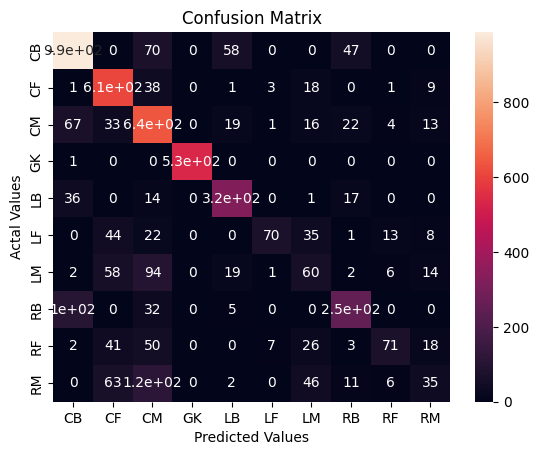

Accuracy : 0.7277540215841988
Precision : 0.7181190807712574
Recall : 0.7277540215841988
F1 Score : 0.7087641990560875
Evaluation of multiclass SVM - dual


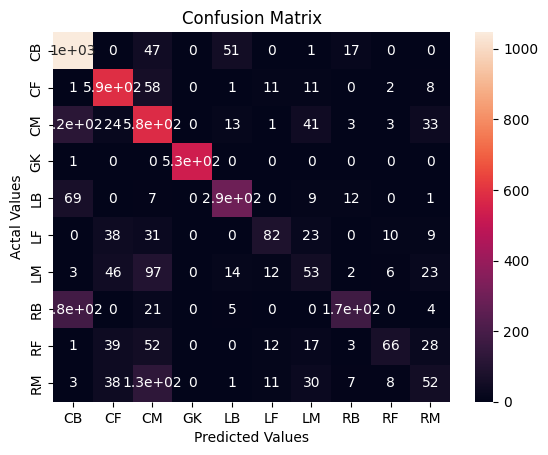

Accuracy : 0.7051517002647119
Precision : 0.6953008385379513
Recall : 0.7051517002647119
F1 Score : 0.6868391195622163


/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayer

K-Fold CV results - Multiclass - SVM
{'fit_time': array([1.57108879, 1.57239485, 1.54858398, 1.56708622, 1.56370902]), 'score_time': array([1.68594933, 1.6863203 , 1.65879703, 1.65986705, 1.65808797]), 'test_score': array([0.72372753, 0.73081793, 0.71613067, 0.7181565 , 0.71757852]), 'train_score': array([0.73630896, 0.73364989, 0.73643558, 0.73459956, 0.73790833])}



In [40]:
print('Support Vector Machines')
from sklearn.svm import SVC


multiclass_svm = SVM_model()
multiclass_svm.train_model_single(X_train, Y_train, X_valid, Y_valid)
multiclass_svm.train_model_multi(X_train, Y_train, X_valid, Y_valid)
multiclass_svm.Kfold(X, Y)
print()

Random Forests
      player_positions
13729               CF
610                 CM
12836               RM
9389                GK
10612               CF


/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Evaluation of Random Forest - single


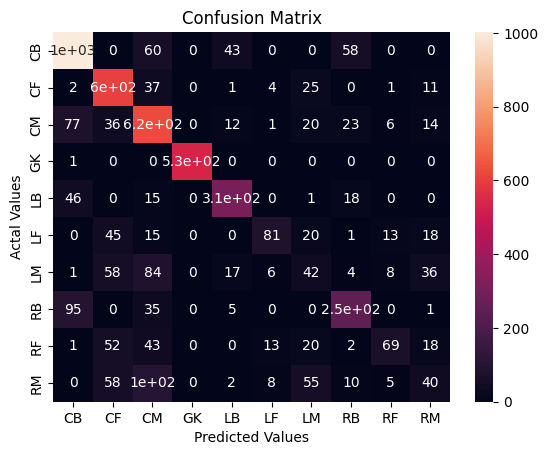

Accuracy : 0.7228670331907961
Precision : 0.7055901627419716
Recall : 0.7228670331907961
F1 Score : 0.7052593307235379
Evaluation of multiclass Random Forest - dual


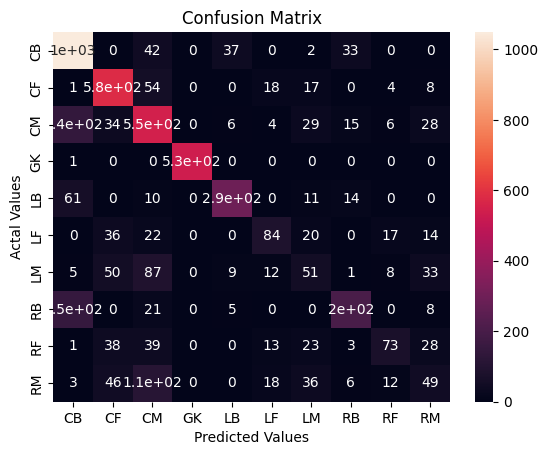

Accuracy : 0.7049480757483201
Precision : 0.6885916475288649
Recall : 0.7049480757483201
F1 Score : 0.6891782387986184


/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/jessica/Downloads/Assigning

K-Fold CV results - Multiclass - RF
{'fit_time': array([1.31747413, 1.3110981 , 1.31102896, 1.30974579, 1.31403399]), 'score_time': array([0.05409169, 0.04279971, 0.04245591, 0.05731511, 0.045367  ]), 'test_score': array([0.71334515, 0.72499367, 0.70625475, 0.71537098, 0.70820669]), 'train_score': array([0.99879709, 0.99860715, 0.99924027, 0.99879709, 0.99917701])}



In [41]:
print('Random Forests')
multiclass_rf = Random_Forest()
multiclass_rf.train_model_single(X_train, Y_train, X_valid, Y_valid)
multiclass_rf.train_model_multi(X_train, Y_train, X_valid, Y_valid)
multiclass_rf.Kfold(X, Y)
print()

MultiLayered Perceptron
{'activation': 'logistic', 'learning_rate': 'invscaling', 'learning_rate_init': 0.05}
0.7083333333333333
      player_positions
13729               CF
610                 CM
12836               RM
9389                GK
10612               CF
Evaluation of MLP - single


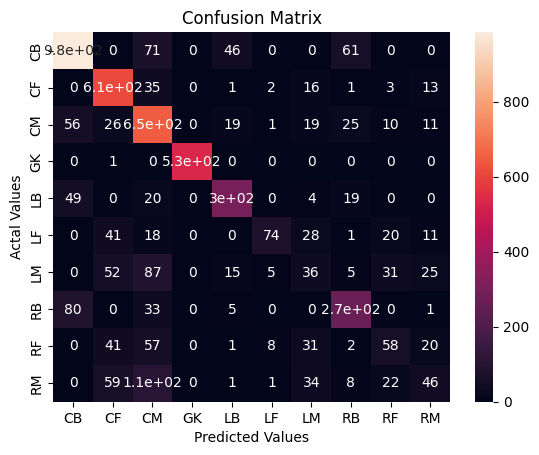

Accuracy : 0.7232742822235797
Precision : 0.7061474501490695
Recall : 0.7232742822235797
F1 Score : 0.7052684706908815


/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1105: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1105: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1105: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = colu

K-Fold CV results - Multiclass - MLP
{'fit_time': array([2.53546405, 2.51728296, 2.49949193, 2.55701876, 2.48662782]), 'score_time': array([0.00281501, 0.00254297, 0.00253987, 0.00265503, 0.00282526]), 'test_score': array([0.72018232, 0.7234743 , 0.71309192, 0.72220815, 0.71656535]), 'train_score': array([0.71972143, 0.71509972, 0.72143083, 0.72396328, 0.72404406])}


/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [42]:
print('MultiLayered Perceptron')
multiclass_mlp = MLP_model()
multiclass_mlp.gridSearch(X_train, Y_train)
multiclass_mlp.train_model_single(X_train, Y_train, X_valid, Y_valid)
multiclass_mlp.Kfold(X, Y)

In [43]:
print('Naive Bayes')
multiclass_nb = NaiveBayes()
multiclass_nb.gnb_single(X_train, Y_train, X_valid, Y_valid)
multiclass_nb.gnb_multi(X_train, Y_train, X_valid, Y_valid)
multiclass_nb.Kfold(X, Y)
print()

Naive Bayes
Evaluation of NB - single: 
The accuracy is  0.6243127672571778
The precision is  0.6408792129658514
The recall is  0.6243127672571778
The f1score is  0.6211748377198054
Evaluation of NB - dual
The accuracy is  0.5353288535939728
The precision is  0.6176661344067046
The recall is  0.5353288535939728
The f1score is  0.5209993138400081
K-Fold CV results - Naive Bayes
Average Test set accuracy : 0.6161359512097377



/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/jessica/Downloads/AssigningPlayer

K Nearest Neighbours
{'n_neighbors': 21, 'weights': 'distance'}
0.6688951917882227
Evaluation of KNN - single


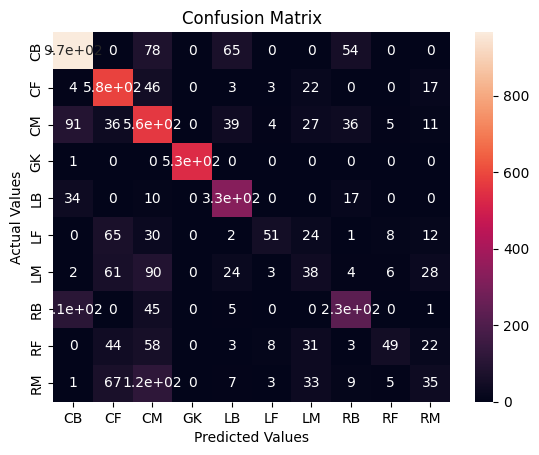

Accuracy : 0.6880472408878029
Precision : 0.6732832527439956
Recall : 0.6880472408878029
F1 Score : 0.6660634087140824


/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/jessica/Downloads/AssigningPlayerPositionsUsingML-main/.venv/lib/python3.12/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/jessica/Downloads/AssigningPlayerPos

K-Fold CV results - Multiclass - RF
{'fit_time': array([0.01327109, 0.01662087, 0.0130167 , 0.01291299, 0.01288605]), 'score_time': array([0.15619111, 0.27017093, 0.22619009, 0.22480774, 0.24838281]), 'test_score': array([0.68624968, 0.694353  , 0.66827045, 0.68042542, 0.66793313]), 'train_score': array([1., 1., 1., 1., 1.])}



In [44]:
print('K Nearest Neighbours')
multiclass_knn =  KNearestNeighbours()
multiclass_knn.gridSearch(X_train, Y_train)
multiclass_knn.train_model_single(X_train, Y_train, X_valid, Y_valid)
multiclass_knn.Kfold(X, Y)
print()

There are 10 unique player positions:

Position encoding: [0 1 2 3 4 5 6 7 8 9]
Position labels: ['CB', 'CF', 'CM', 'GK', 'LB', 'LF', 'LM', 'RB', 'RF', 'RM']
Best value of max_depth = 10



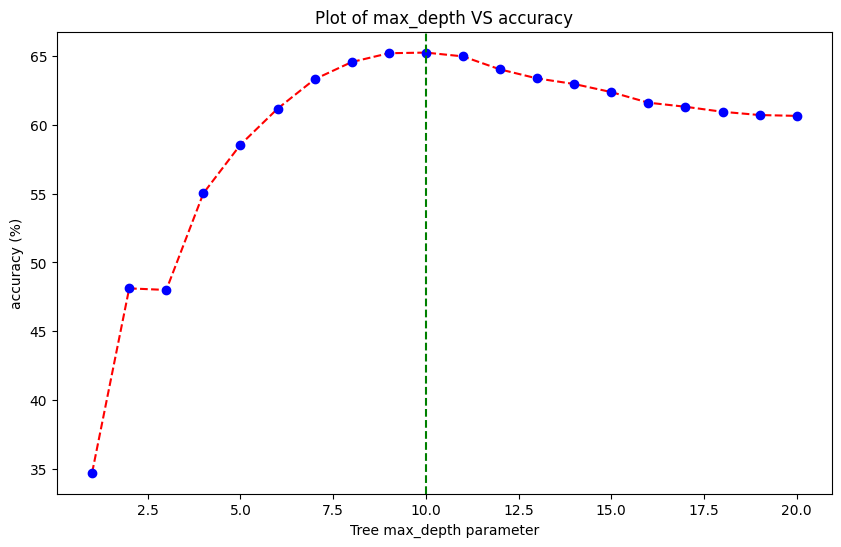

DecisionTreeClassifier(max_depth=10, random_state=7)
DECISION TREE MODEL PERFORMANCE

Accuracy = 0.659
Precision = 0.646
Recall = 0.659

CLASSIFICATION REPORT

              precision    recall  f1-score   support

          CB       0.76      0.82      0.79      1163
          CF       0.68      0.80      0.73       680
          CM       0.53      0.66      0.59       814
          GK       1.00      1.00      1.00       534
          LB       0.70      0.76      0.73       389
          LF       0.62      0.32      0.42       193
          LM       0.20      0.17      0.18       256
          RB       0.58      0.46      0.52       386
          RF       0.59      0.21      0.31       218
          RM       0.25      0.17      0.20       278

    accuracy                           0.66      4911
   macro avg       0.59      0.54      0.55      4911
weighted avg       0.65      0.66      0.64      4911



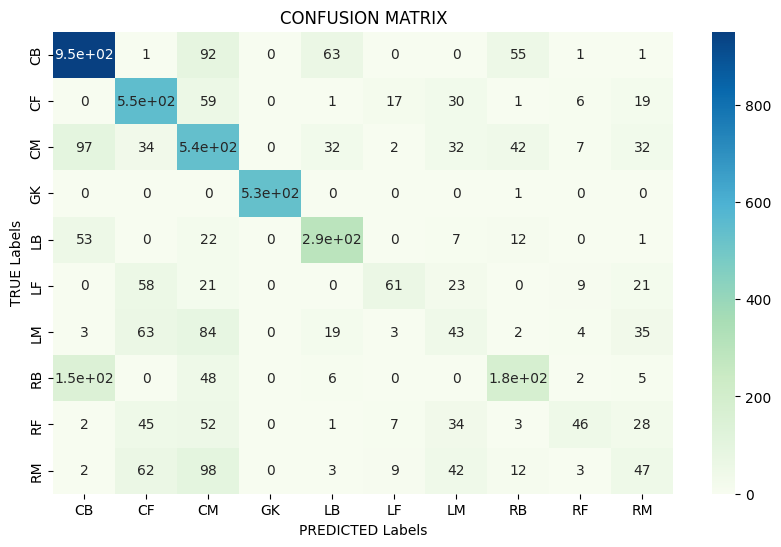

DECISION TREE
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0105049 to fit


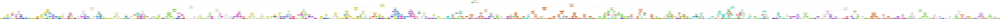

ADABoost Classifier
Test Accuracy: [0.63734474 0.67969864 0.68926899 0.69130523 0.69843209 0.7043372
 0.70413358 0.70555895 0.70189371 0.7051517  0.70840969 0.70861332
 0.70902057 0.71024231]

Max Accuracy = 0.7102 with n_estimators = 140

CLASSIFICATION REPORT

              precision    recall  f1-score   support

          CB       0.80      0.87      0.83      1163
          CF       0.71      0.87      0.78       680
          CM       0.56      0.80      0.66       814
          GK       1.00      1.00      1.00       534
          LB       0.82      0.70      0.75       389
          LF       0.66      0.38      0.48       193
          LM       0.25      0.16      0.20       256
          RB       0.73      0.56      0.64       386
          RF       0.65      0.29      0.41       218
          RM       0.27      0.12      0.17       278

    accuracy                           0.71      4911
   macro avg       0.65      0.58      0.59      4911
weighted avg       0.70      0.71

In [45]:
le = preprocessing.LabelEncoder()
df['player_positions'] = le.fit_transform(df['player_positions'])
df_dt = df
df_dt = df.drop(labels = ['horizontal_position', 'vertical_position', 'player_positions'], axis = 1)
feature_names = list(df_dt.columns)
pos_num = np.unique(df['player_positions'])
print(f'There are {len(pos_num)} unique player positions:\n')

pos_label = ['CB', 'CF', 'CM', 'GK', 'LB', 'LF', 'LM', 'RB', 'RF', 'RM']
print(f'Position encoding: {pos_num}')
print(f'Position labels: {pos_label}')

Y_train = Y_train[['player_positions']]
Y_valid = Y_valid['player_positions']

dtree_model = DecisionTree(X_train, Y_train, X_valid, Y_valid, feature_names, pos_label, criterion='gini', find_best_depth=True)
print(dtree_model.dtree)

dtree_model.train_model()
dtree_model.predict()
dtree_model.evaluate()

dtree_model.confusion_matrix()

print("DECISION TREE")
dtree_model.visualise()     
!dot -Tpng dtree_graphviz.dot -Gdpi=3000 -o dtree_graphviz.png
display(Image.open('dtree_graphviz.png'))

boosting(X_train, Y_train, X_valid, Y_valid)